### Importing Libraries used

In [14]:
import scanpy as sc
import numpy as np
import pandas as pd
from matplotlib.pyplot import rc_context
import warnings
import os
import anndata as ad
import seaborn as sns
import squidpy as sq

In [15]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
warnings.filterwarnings('ignore')
sc.settings.set_figure_params(dpi=300, facecolor='white')

scanpy==1.9.3 anndata==0.9.2 umap==0.5.3 numpy==1.23.4 scipy==1.11.2 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 pynndescent==0.5.10


### Setting up base directories

In [16]:
#set up the base directory
base_dir = 'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\ark-analysis-0.6.3\\data\\preprint\\2023-07-18-KK-BC25_21_1_KK003'
#set up the directory with the cell tables after running cellpose
cell_table_dir = os.path.join(base_dir, "segmentation\\cell_table")

In [17]:
# Loading in dataframe
df = pd.read_csv(os.path.join(cell_table_dir, '2023-07-18-KK-BC25_21_1_cell_table_clustered_mesmerv2.csv'))

In [5]:
df

,Unnamed: 0,cell_size,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,...,convex_hull_resid,centroid_dif,num_concavities,fov,roi,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color
0,0,120.0,0.040821,0.000000,0.288043,0.170178,0.000000,0.000000,0.000000,0.000000,...,0.062500,0.020808,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Macrophages,Mono/Mac,Myeloid,Immune,lightgray
1,1,65.0,0.799789,0.434090,0.611390,0.390329,0.659535,0.000000,0.055256,0.000000,...,0.029851,0.016378,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
2,2,61.0,0.463938,0.055665,0.765521,0.000000,0.350014,0.000000,0.000000,0.496780,...,0.061538,0.015469,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
3,3,166.0,0.442477,0.531738,0.253565,0.151395,0.472460,0.000000,0.184816,0.465811,...,0.045977,0.013903,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CD4,T cells,Lymphoid,Immune,lightgray
4,4,111.0,0.381852,0.804111,0.000000,0.431157,0.914409,0.000000,0.000000,0.057484,...,0.067227,0.017323,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CD4,T cells,Lymphoid,Immune,lightgray
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24994,24994,143.0,0.275791,0.000000,0.000000,0.435577,0.079685,0.000000,0.682314,0.000000,...,0.033784,0.007310,0.0,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,CD4,T cells,Lymphoid,Immune,lightgray
24995,24995,136.0,0.683072,0.006205,0.051145,0.009625,0.195570,0.000000,0.000000,0.000000,...,0.035461,0.007670,0.0,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,Epithelial cells,Epithelial cells,Epithelial,Non-immune,lightgray
24996,24996,57.0,0.277131,0.741102,0.860181,0.536623,0.099907,0.000000,0.104680,0.198335,...,0.065574,0.015098,0.0,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
24997,24997,66.0,0.000000,0.000000,0.691311,0.583682,0.000000,0.000000,0.269230,0.000000,...,0.043478,0.014401,0.0,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray


In [10]:
df.drop(columns=df.columns[0], axis=1, inplace=True)
df.head()

,cell_size,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,CD23,...,convex_hull_resid,centroid_dif,num_concavities,fov,roi,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color
0,120.0,0.040821,0.000000,0.288043,0.170178,0.000000,0.0,0.000000,0.000000,0.000000,...,0.062500,0.020808,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Macrophages,Mono/Mac,Myeloid,Immune,lightgray
1,65.0,0.799789,0.434090,0.611390,0.390329,0.659535,0.0,0.055256,0.000000,0.397882,...,0.029851,0.016378,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
2,61.0,0.463938,0.055665,0.765521,0.000000,0.350014,0.0,0.000000,0.496780,0.045169,...,0.061538,0.015469,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
3,166.0,0.442477,0.531738,0.253565,0.151395,0.472460,0.0,0.184816,0.465811,0.198809,...,0.045977,0.013903,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CD4,T cells,Lymphoid,Immune,lightgray
4,111.0,0.381852,0.804111,0.000000,0.431157,0.914409,0.0,0.000000,0.057484,0.033993,...,0.067227,0.017323,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,CD4,T cells,Lymphoid,Immune,lightgray


### Turn data into anndata format for Scanpy

In [11]:
# Specifying which obs to include in anndata
obs_list = ['label', 'fov', 'roi', 'X', 'Y', 'cell_size', 'scyan_pop', 'scyan_pop_Level_3', 'scyan_pop_Level_2', 'scyan_pop_Level_1', 'color','equivalent_diameter', 'area']
# Specifying which channels to include in anndata
channels_to_use = ['ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20', 'CD21',
       'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8', 'CD98',
       'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1', 'GZMB',
       'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1', 'PKM2',
       'PanCK', 'SMA', 'TCF', 'Tox']

In [79]:
len(channels_to_use)

37

In [80]:
def generate_anndata(df, channels_to_use, obs_list):    
    expression_data = np.array(df[channels_to_use])
    metadata = df[obs_list]
    anndata_obj = ad.AnnData(expression_data, 
                             obs=metadata,
                            dtype="float")
    anndata_obj.var_names = pd.Series(channels_to_use).astype("string").to_list()
    return anndata_obj

In [81]:
#generate the anndata from the cell table- dont know how to add X,Y as X.obsm- for squidpy!
adata = generate_anndata(df, channels_to_use= channels_to_use, obs_list= obs_list)

In [82]:
adata.var_names

Index(['ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20', 'CD21',
       'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8', 'CD98',
       'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1', 'GZMB',
       'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1', 'PKM2',
       'PanCK', 'SMA', 'TCF', 'Tox'],
      dtype='object')

In [83]:
adata.X

array([[0.04082127, 0.        , 0.28804267, ..., 0.75404857, 0.02063841,
        0.        ],
       [0.79978877, 0.43409027, 0.61139034, ..., 0.66038254, 0.36307318,
        0.        ],
       [0.46393801, 0.05566525, 0.7655208 , ..., 0.91842012, 0.30160744,
        0.        ],
       ...,
       [0.27713088, 0.74110183, 0.86018133, ..., 0.84048371, 0.00807982,
        0.        ],
       [0.        , 0.        , 0.69131071, ..., 0.        , 0.17722605,
        0.        ],
       [0.16536121, 0.41983029, 0.        , ..., 0.        , 0.21928824,
        0.        ]])

In [84]:
min_val = np.min(adata.X)
max_val = np.max(adata.X)

print("Minimum value:", min_val)
print("Maximum value:", max_val)

Minimum value: 0.0
Maximum value: 1.4429388624590274


In [85]:
adata.obs.head()

,label,fov,roi,X,Y,cell_size,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color,equivalent_diameter,area
0,1.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,2.733333,818.466667,120.0,Macrophages,Mono/Mac,Myeloid,Immune,lightgray,12.360774,120.0
1,2.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,2.261538,920.184615,65.0,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray,9.097284,65.0
2,3.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,3.295082,937.180328,61.0,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray,8.812923,61.0
3,4.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,3.879518,396.066265,166.0,CD4,T cells,Lymphoid,Immune,lightgray,14.538149,166.0
4,5.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,4.360360,454.324324,111.0,CD4,T cells,Lymphoid,Immune,lightgray,11.888212,111.0


### Save the anndata

In [91]:
# Save anndata here if needed
adata.write_h5ad(os.path.join(cell_table_dir,('cell_table_anndata_analysis_mesmerv2.h5ad')))

## Read in anndata for analysis

In [18]:
####read in anndata object, if you want to start from here
#set up the base directory
base_dir = 'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\ark-analysis-0.6.3\\data\\preprint\\2023-07-18-KK-BC25_21_1_KK003'
#set up the directory with the cell tables after running cellpose
cell_table_dir = os.path.join(base_dir, "segmentation\\cell_table")

In [19]:
adata = ad.read_h5ad(os.path.join(cell_table_dir,('cell_table_anndata_analysis_mesmerv2.h5ad')))

In [20]:
adata

AnnData object with n_obs × n_vars = 24999 × 37
    obs: 'label', 'fov', 'roi', 'X', 'Y', 'cell_size', 'scyan_pop', 'scyan_pop_Level_3', 'scyan_pop_Level_2', 'scyan_pop_Level_1', 'color', 'equivalent_diameter', 'area'
    uns: 'scyan_pop_colors'

## Violin plots of genes

In [24]:
clusters_to_drop = 'Unknown'

adata_filtered = adata[adata.obs['scyan_pop'] != clusters_to_drop].copy()

In [20]:
groupby_order = ['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

### TCF

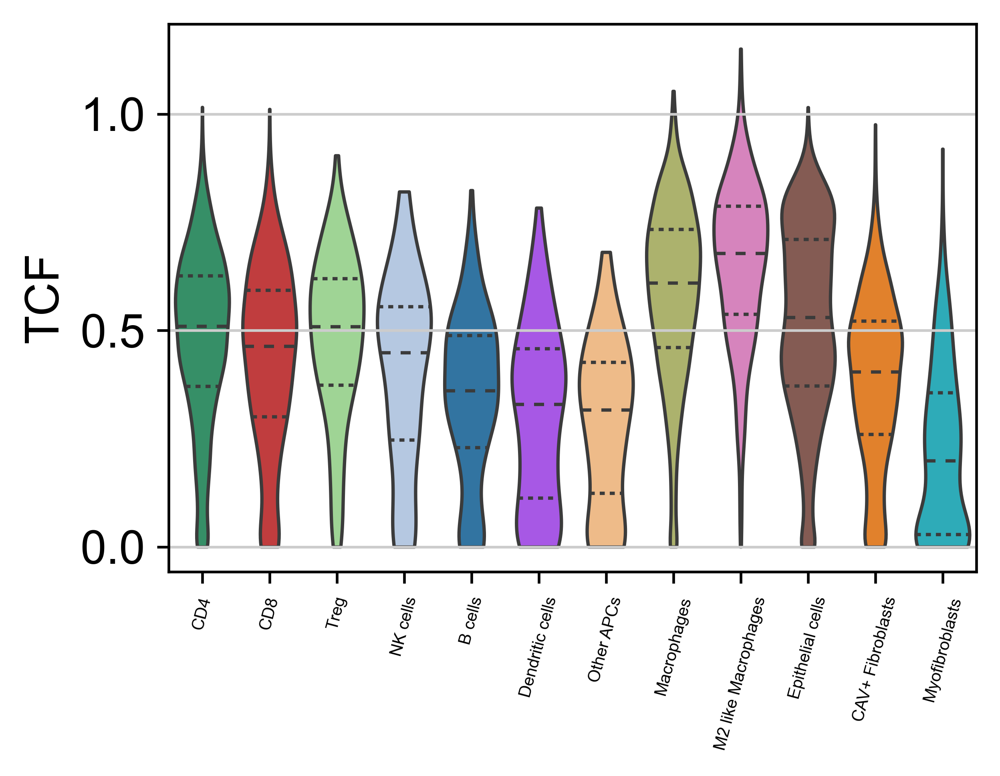

In [115]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 5, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['TCF'], groupby = 'scyan_pop', rotation = 75, stripplot = False, order = groupby_order, inner = 'quartile')

In [39]:
sns_channels = ['CD4', 'CD8', 'Treg', 'M2 like Macrophages', 'Macrophages']

In [40]:
df_filtered = df[df['scyan_pop'].isin(sns_channels)]

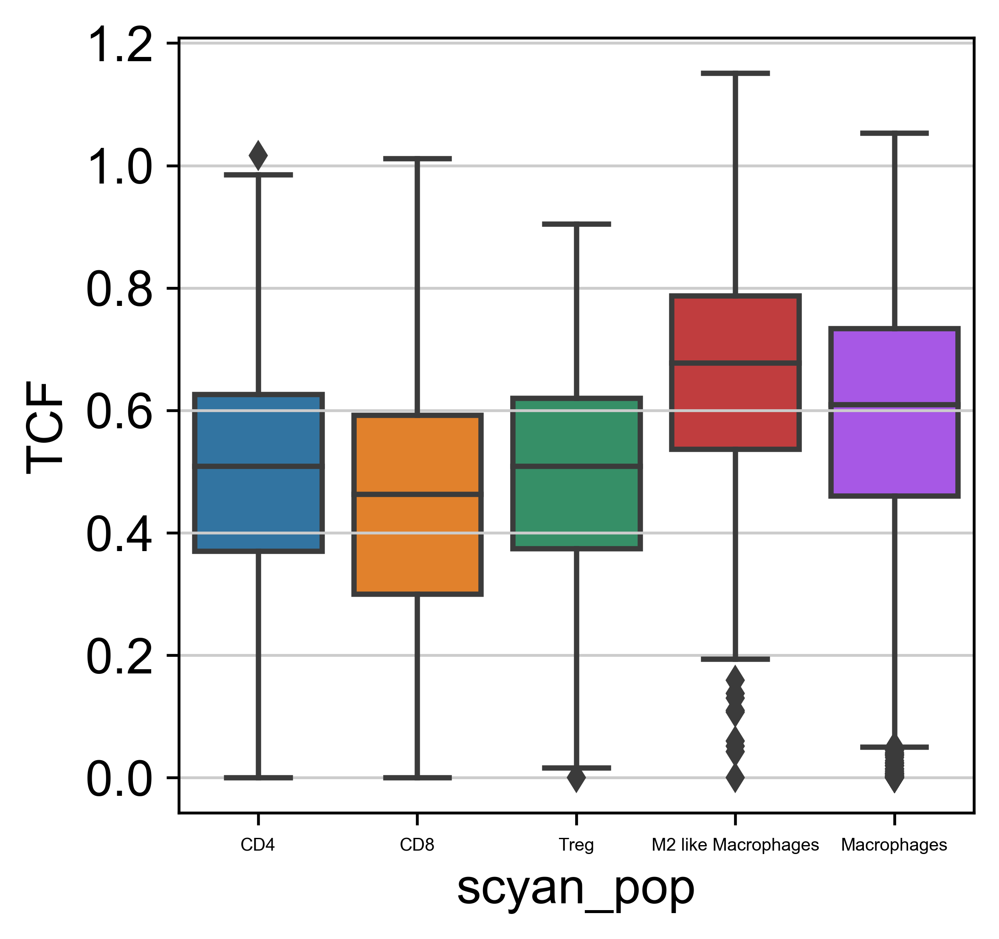

In [41]:
with rc_context({'xtick.labelsize' : 5}):
    sns.boxplot(x='scyan_pop', y='TCF', data=df_filtered, order=sns_channels)

### IL-10

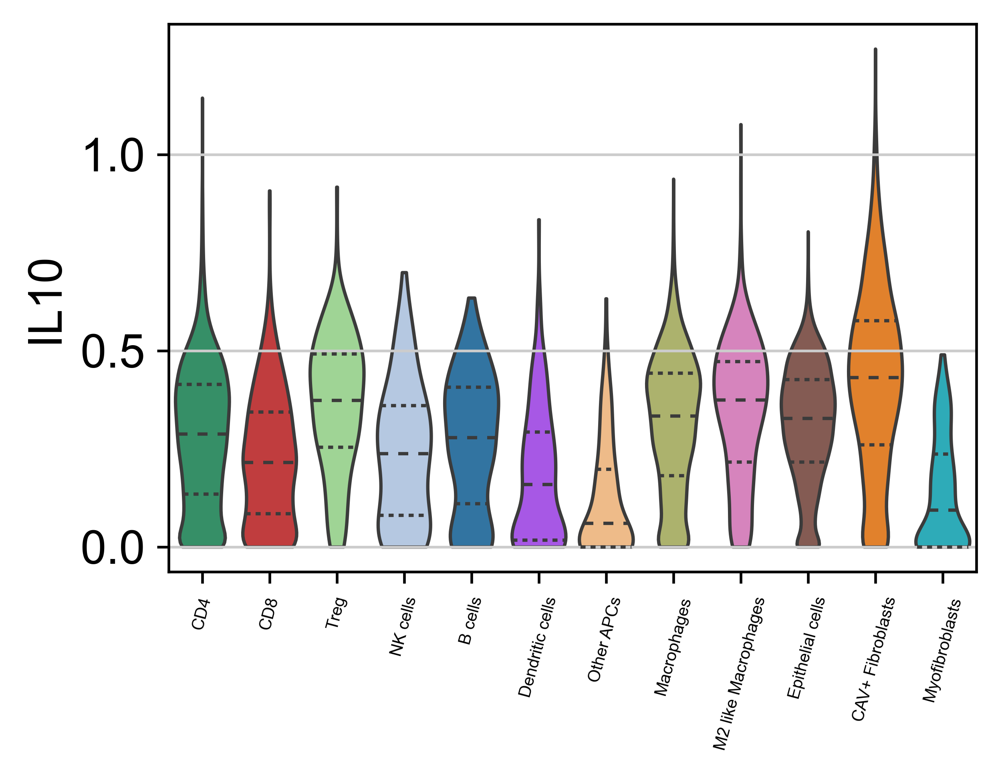

In [116]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 5, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['IL10'], groupby = 'scyan_pop', rotation = 75, stripplot = False, order = groupby_order, inner = 'quartile')

In [88]:
sns_channels = ['Treg', 'M2 like Macrophages', 'Macrophages', 'CD4', 'CD8', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs']

In [7]:
df_filtered = df[df['scyan_pop'].isin(sns_channels)]

NameError: name 'sns_channels' is not defined

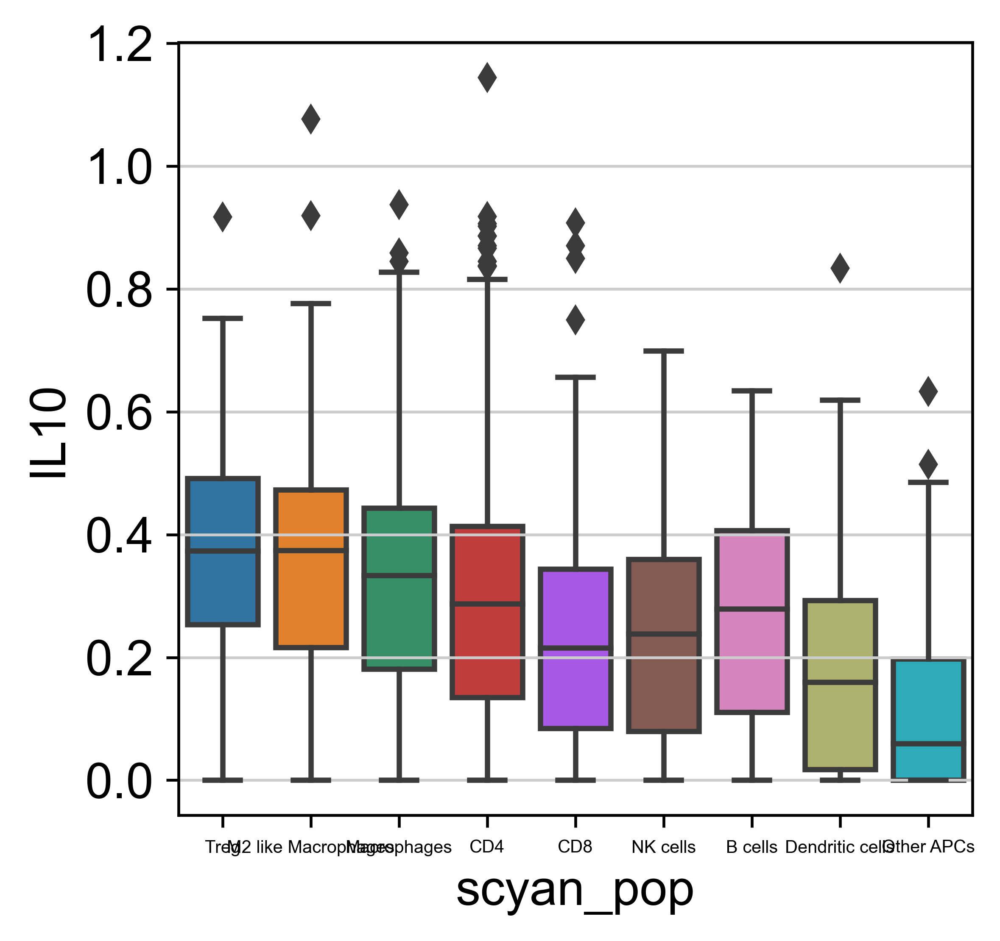

In [90]:
with rc_context({'xtick.labelsize' : 5}):
    sns.boxplot(x='scyan_pop', y='IL10', data=df_filtered, order=sns_channels)

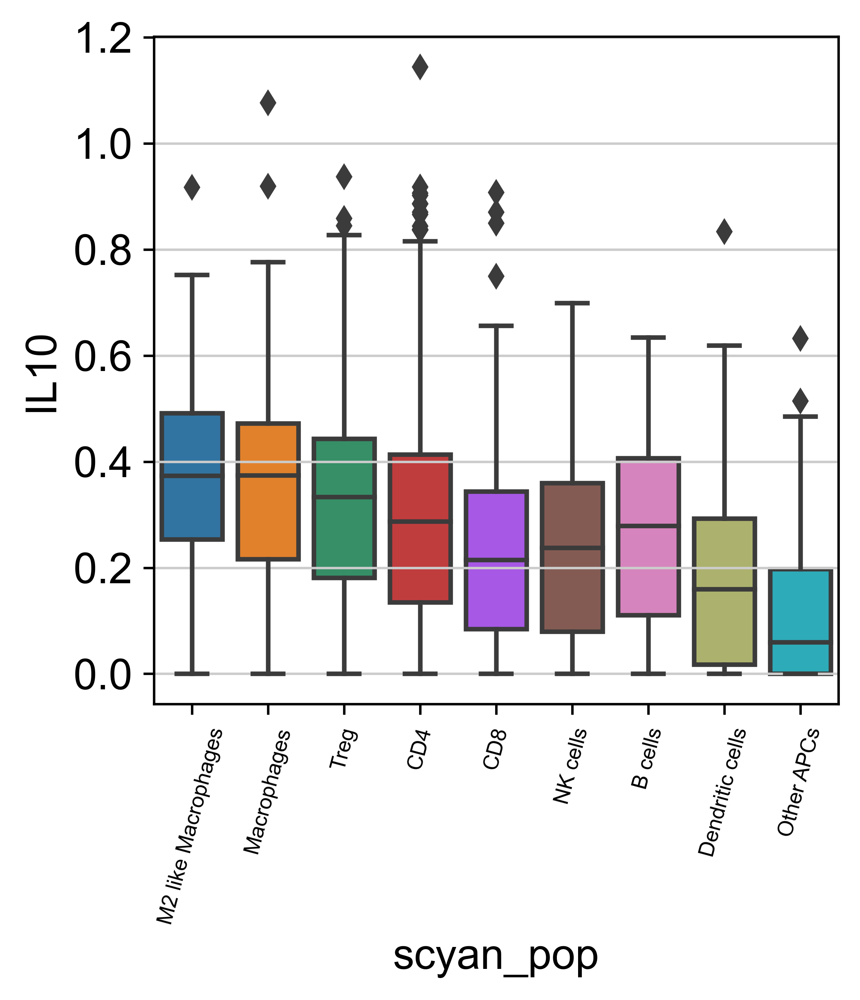

In [95]:
with rc_context({'xtick.labelsize' : 7}):
    ax = sns.boxplot(x='scyan_pop', y='IL10', data=df_filtered, order=sns_channels)
    ax.set_xticklabels(['M2 like Macrophages', 'Macrophages', 'Treg', 'CD4', 'CD8', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs'], rotation=75)

### CXCL13

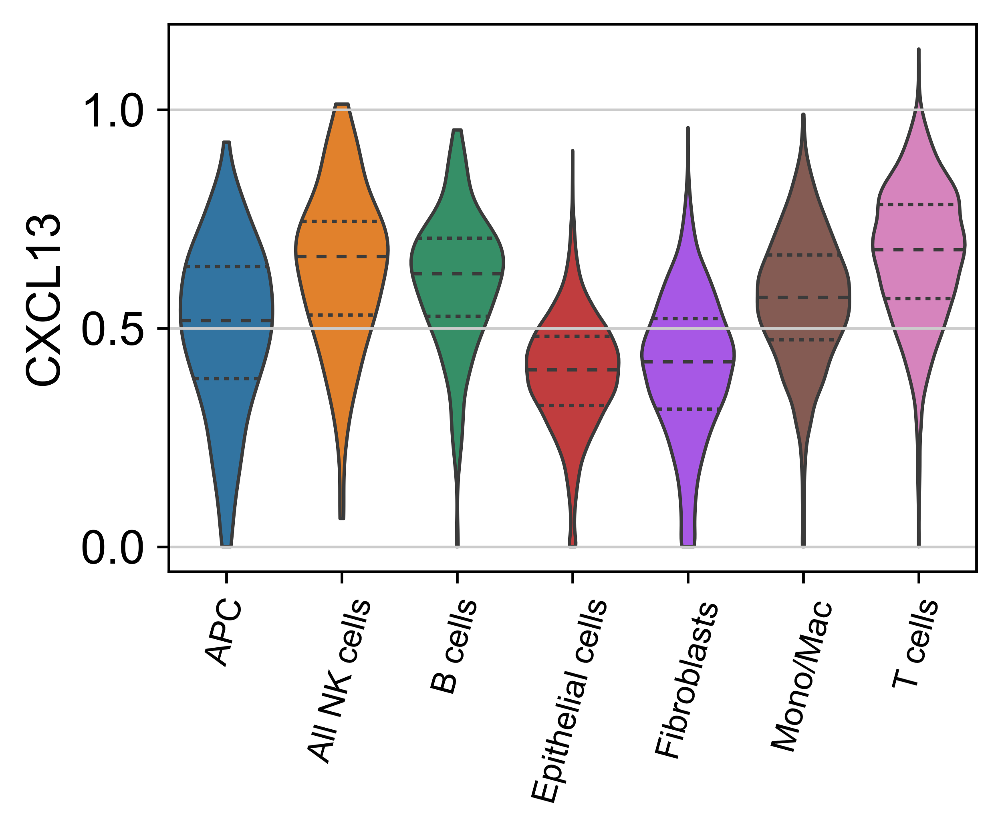

In [96]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 10, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['CXCL13'], groupby = 'scyan_pop_Level_3', rotation = 75, stripplot = False, inner = 'quartile')

In [8]:
sns_channels = ['T cells', 'B cells', 'All NK cells', 'APC', 'Mono/Mac', 'Epithelial cells', 'Fibroblasts']

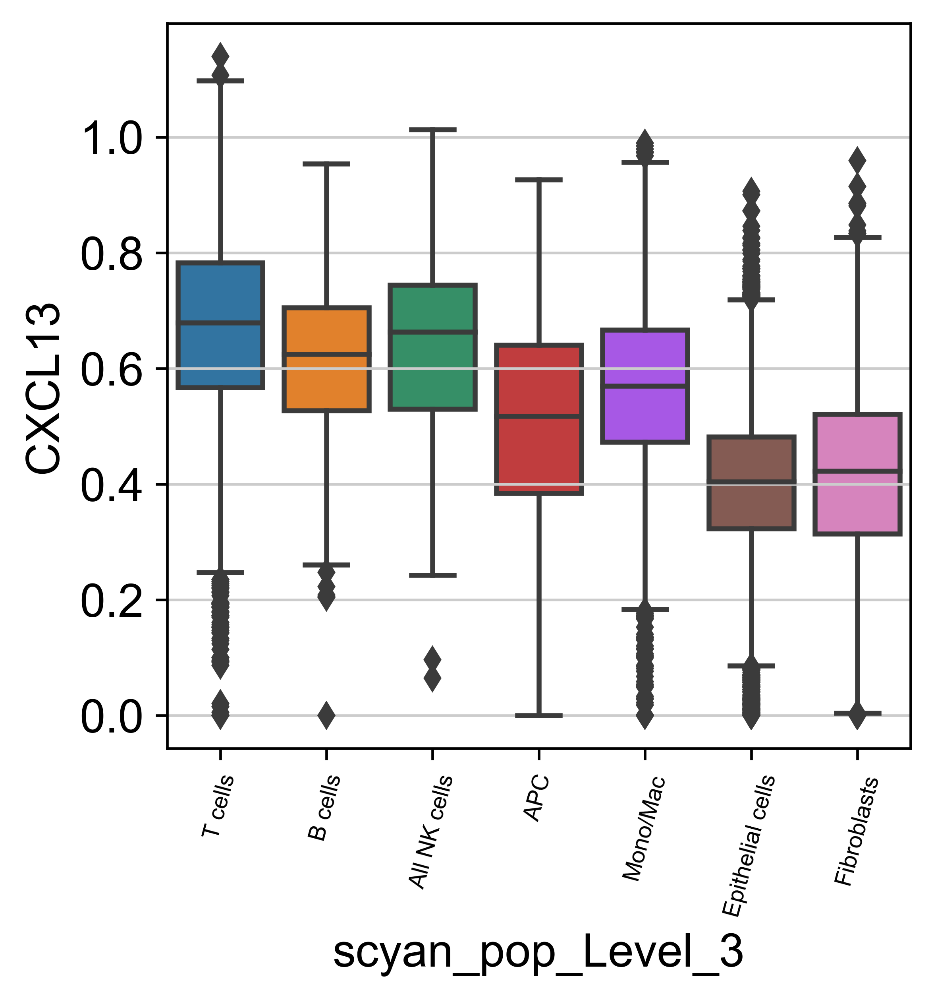

In [10]:
with rc_context({'xtick.labelsize' : 7}):
    ax = sns.boxplot(x='scyan_pop_Level_3', y='CXCL13', data=df, order=sns_channels)
    ax.set_xticklabels(['T cells', 'B cells', 'All NK cells', 'APC', 'Mono/Mac', 'Epithelial cells', 'Fibroblasts'], rotation=75)

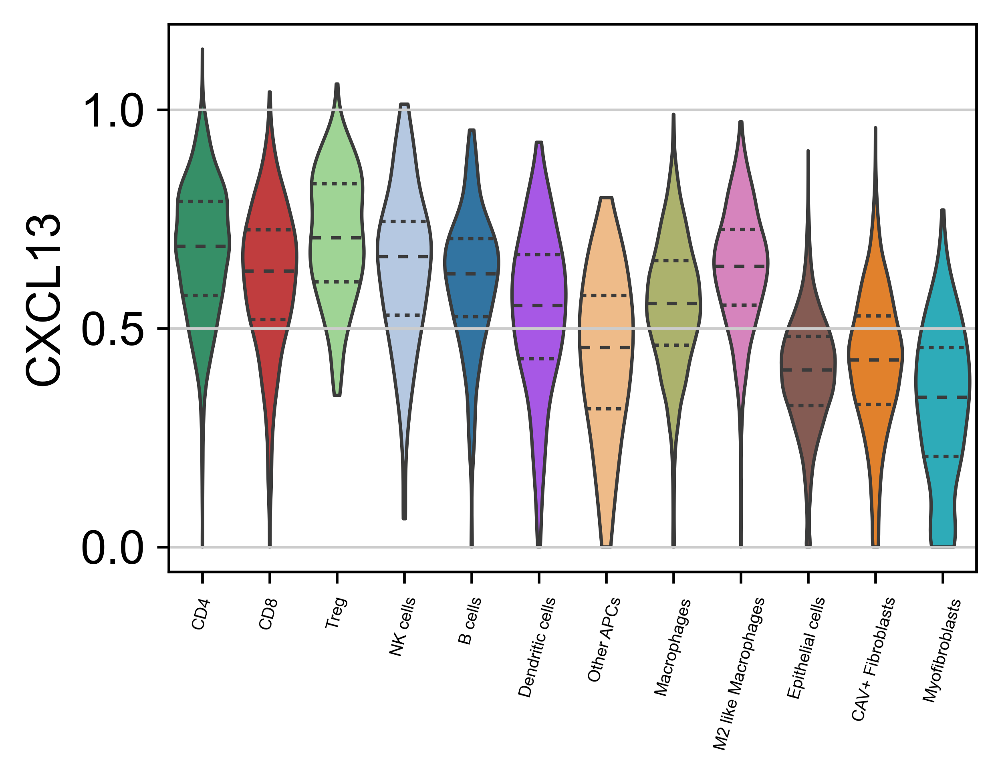

In [121]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 5, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['CXCL13'], groupby = 'scyan_pop', rotation = 75, stripplot = False, order = groupby_order, inner = 'quartile')

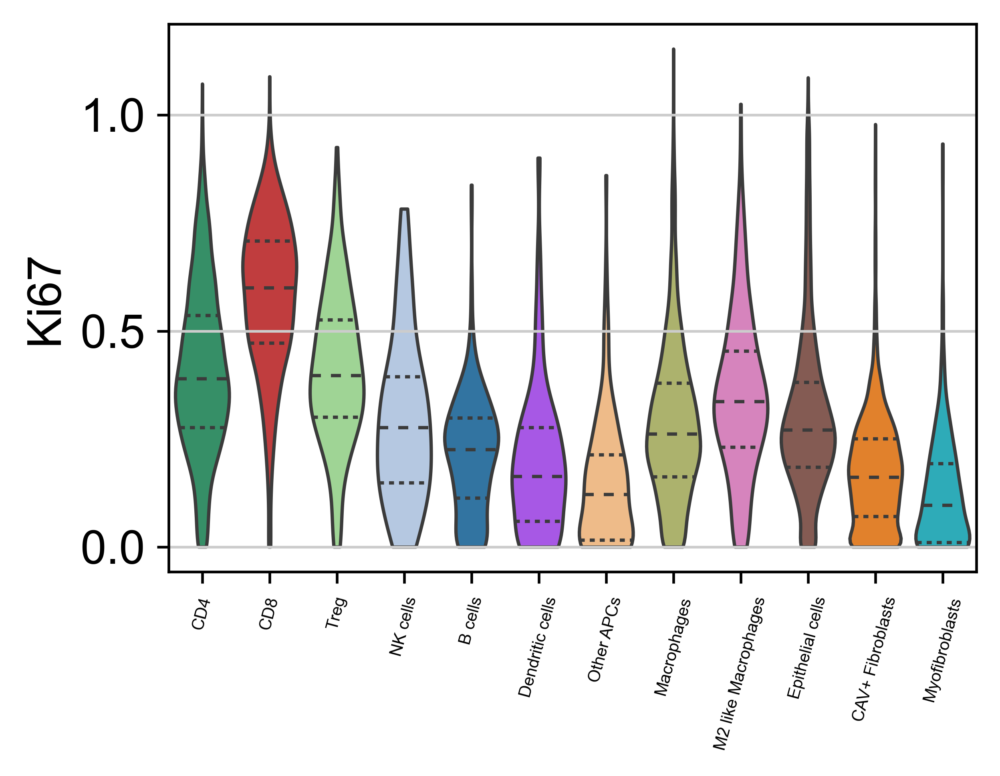

In [131]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 5, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['Ki67'], groupby = 'scyan_pop', rotation = 75, stripplot = False, order = groupby_order, inner = 'quartile')

In [13]:
sns_channels = ['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

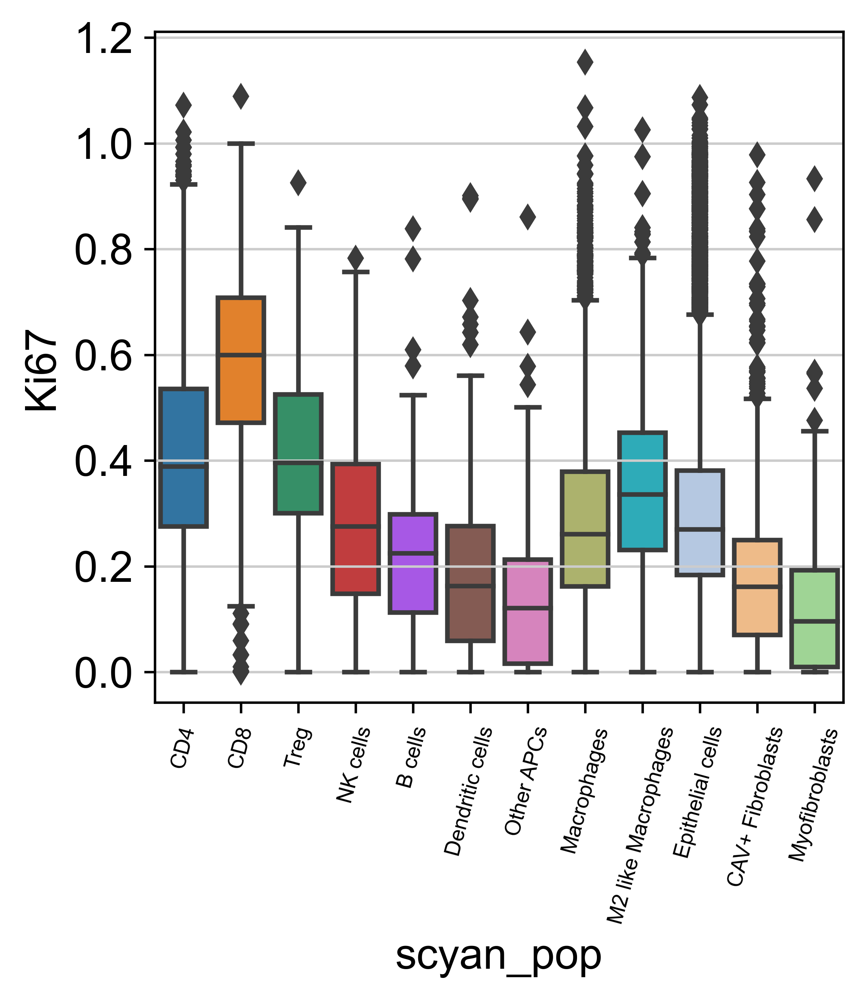

In [15]:
with rc_context({'xtick.labelsize' : 7}):
    ax = sns.boxplot(x='scyan_pop', y='Ki67', data=df, order=sns_channels)
    ax.set_xticklabels(['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts'], rotation=75)

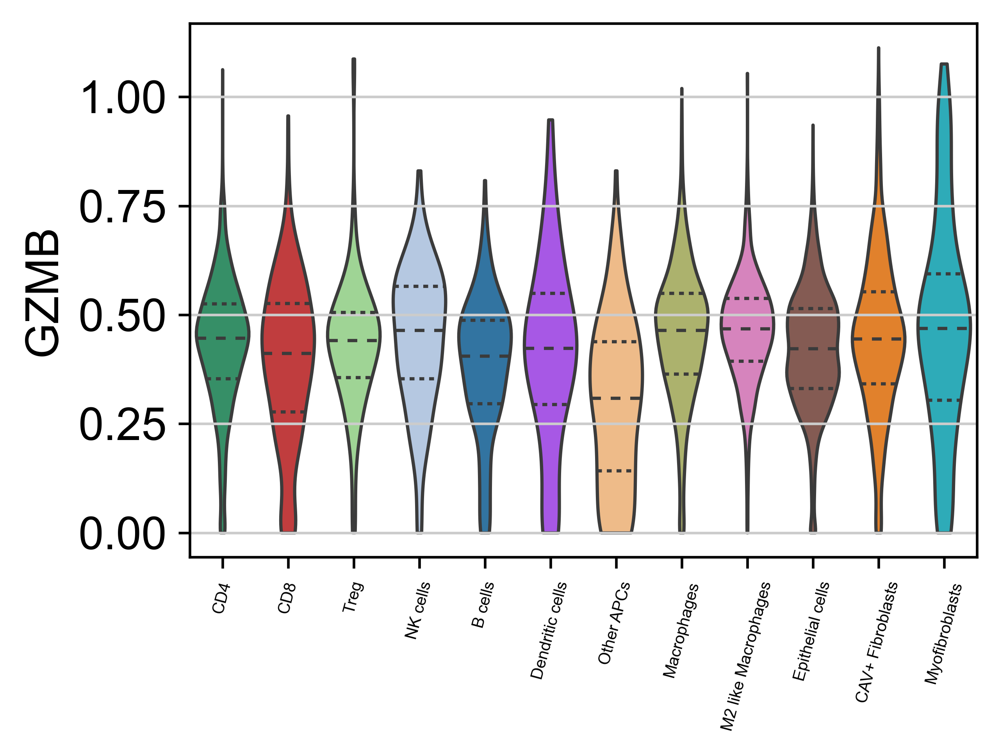

In [54]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 5, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['GZMB'], groupby = 'scyan_pop', rotation = 75, stripplot = False, order = groupby_order, inner = 'quartile')

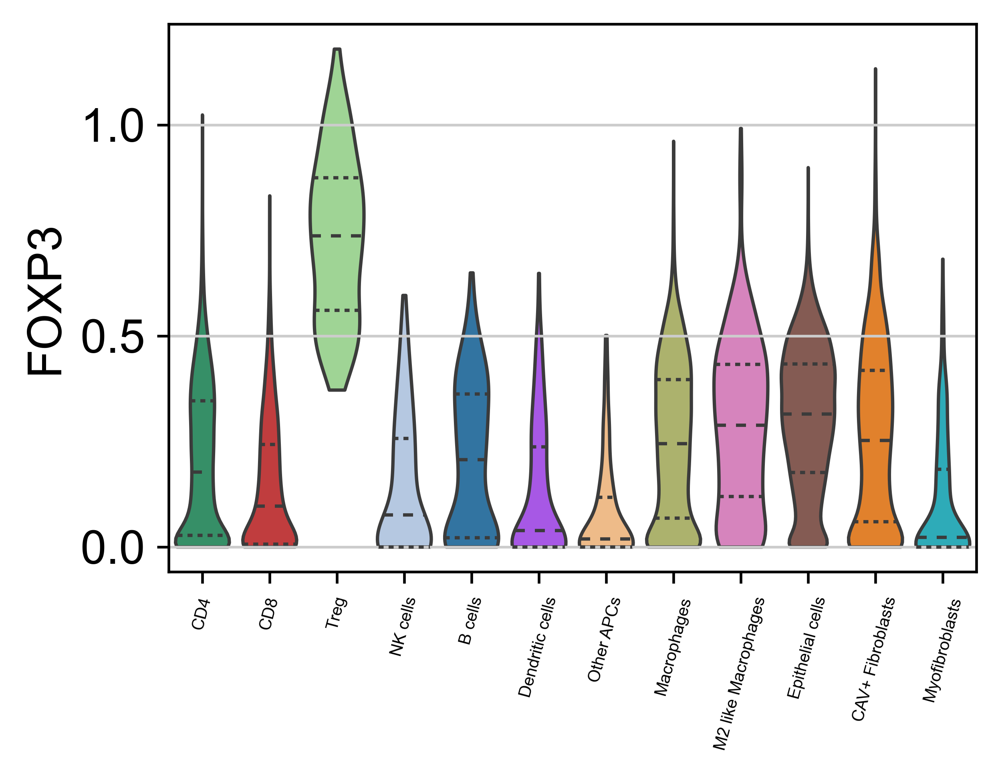

In [55]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 5, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['FOXP3'], groupby = 'scyan_pop', rotation = 75, stripplot = False, order = groupby_order, inner = 'quartile')

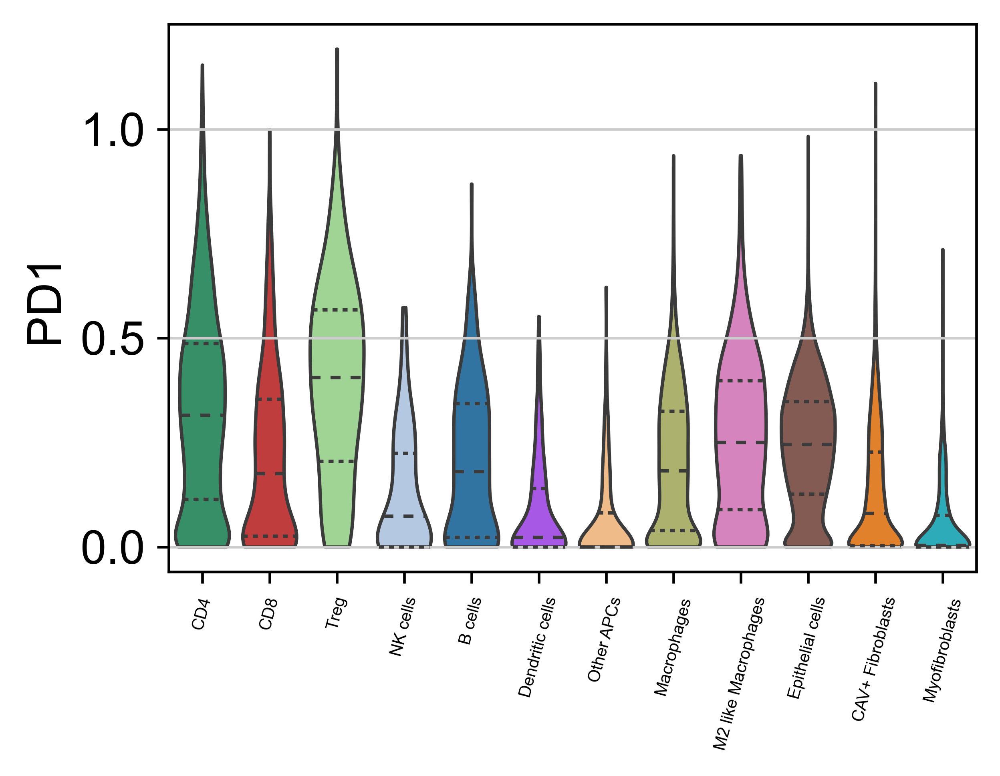

In [21]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 5, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['PD1'], groupby = 'scyan_pop', rotation = 75, stripplot = False, order = groupby_order, inner = 'quartile')

In [24]:
sns_channels = ['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

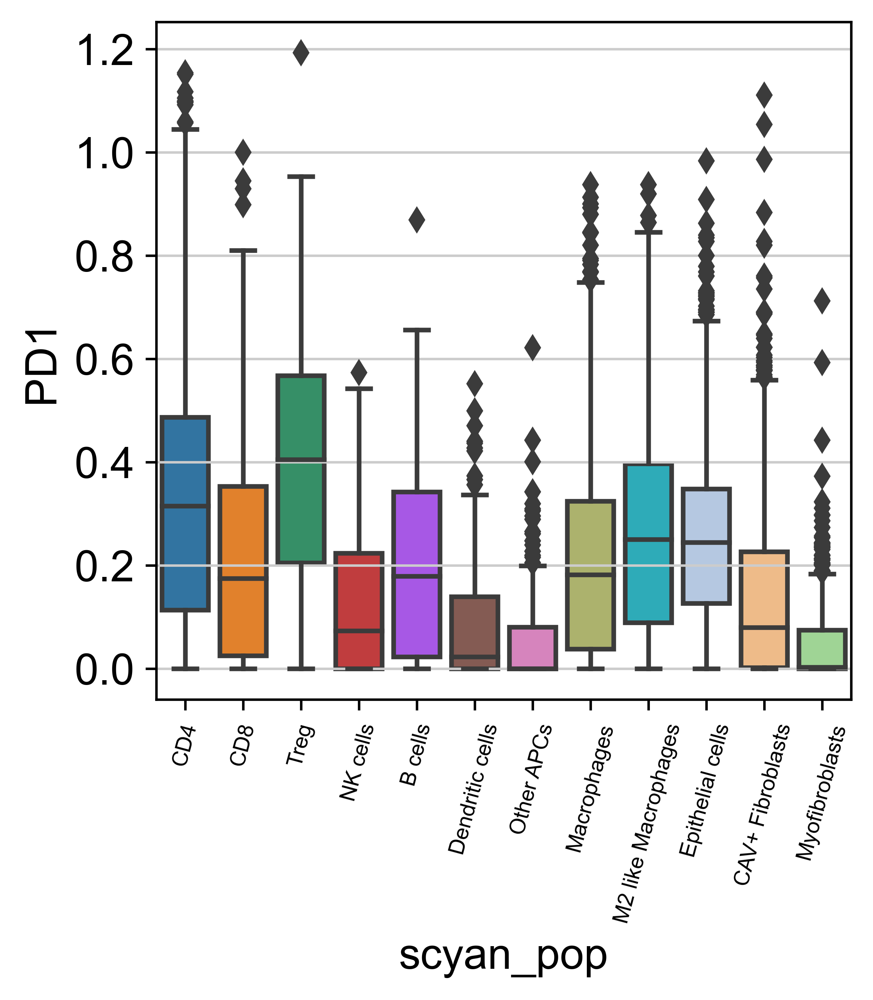

In [25]:
with rc_context({'xtick.labelsize' : 7}):
    ax = sns.boxplot(x='scyan_pop', y='PD1', data=df, order=sns_channels)
    ax.set_xticklabels(['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts'], rotation=75)

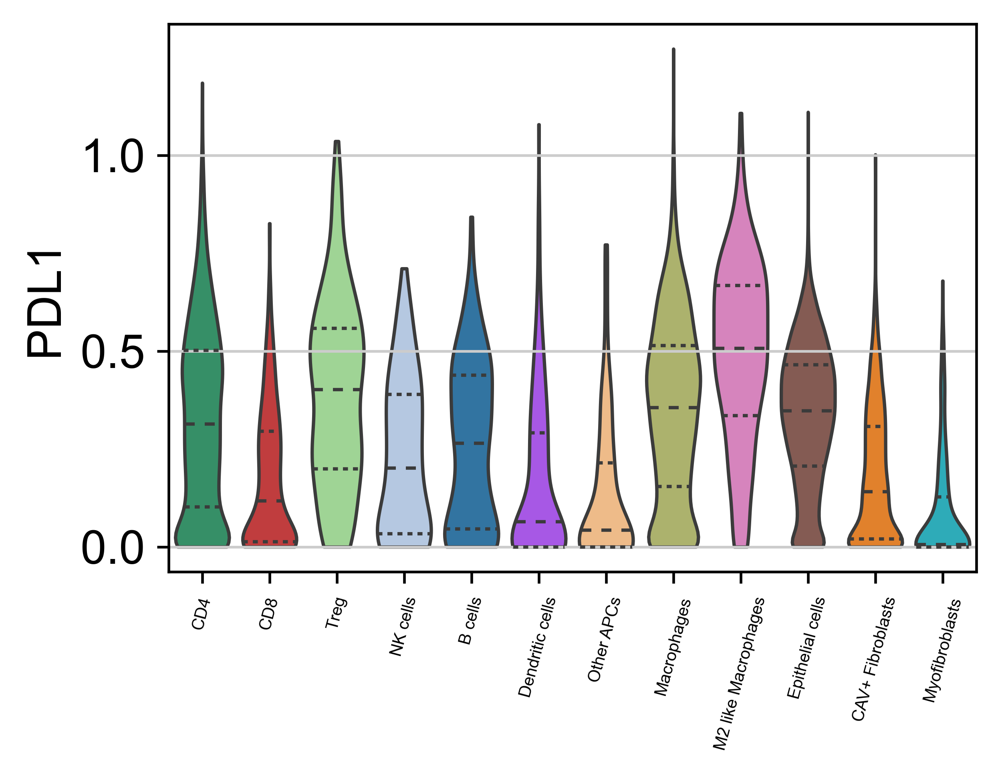

In [22]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 5, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['PDL1'], groupby = 'scyan_pop', rotation = 75, stripplot = False, order = groupby_order, inner = 'quartile')

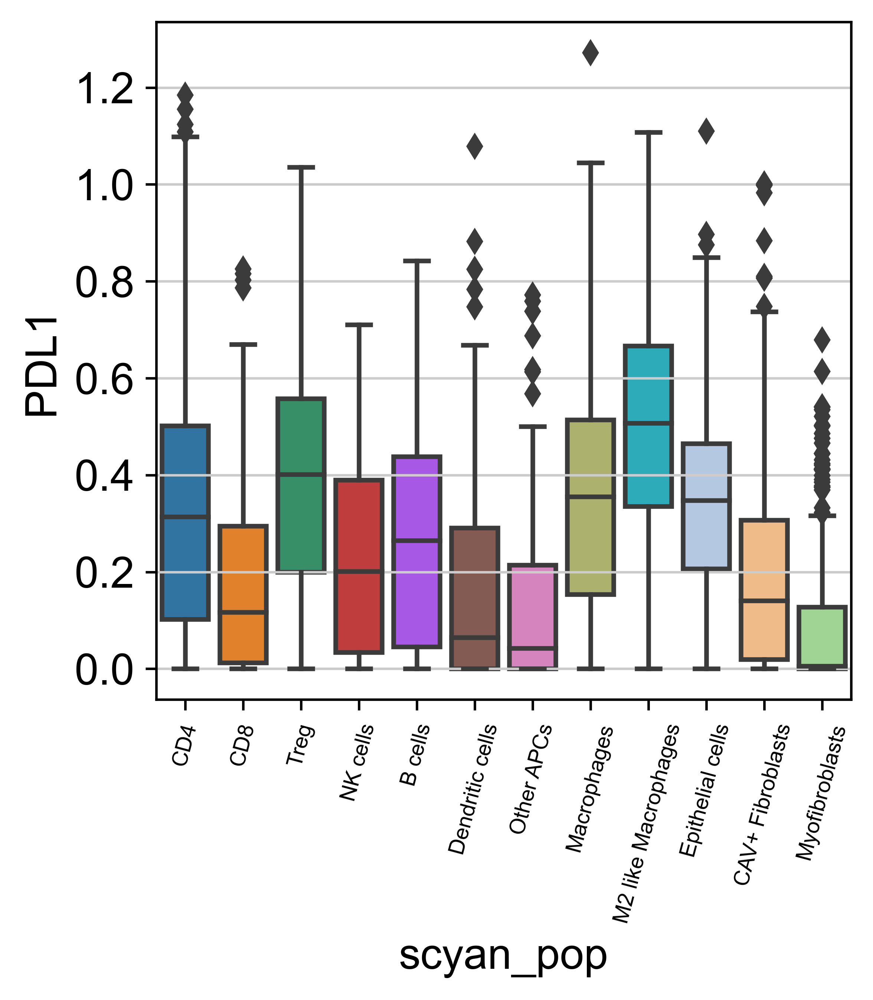

In [26]:
with rc_context({'xtick.labelsize' : 7}):
    ax = sns.boxplot(x='scyan_pop', y='PDL1', data=df, order=sns_channels)
    ax.set_xticklabels(['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts'], rotation=75)

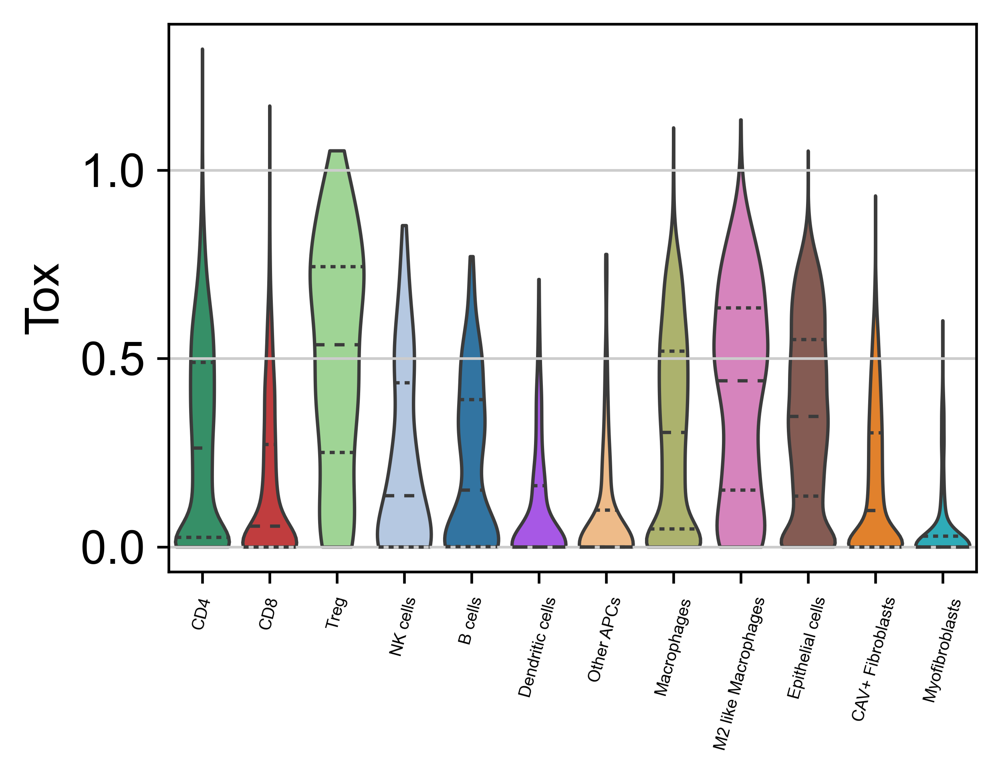

In [23]:
with rc_context({'figure.figsize': (4.5, 3), 'xtick.labelsize': 5, 'lines.linewidth': 1.0}):
    sc.pl.violin(adata_filtered, ['Tox'], groupby = 'scyan_pop', rotation = 75, stripplot = False, order = groupby_order, inner = 'quartile')

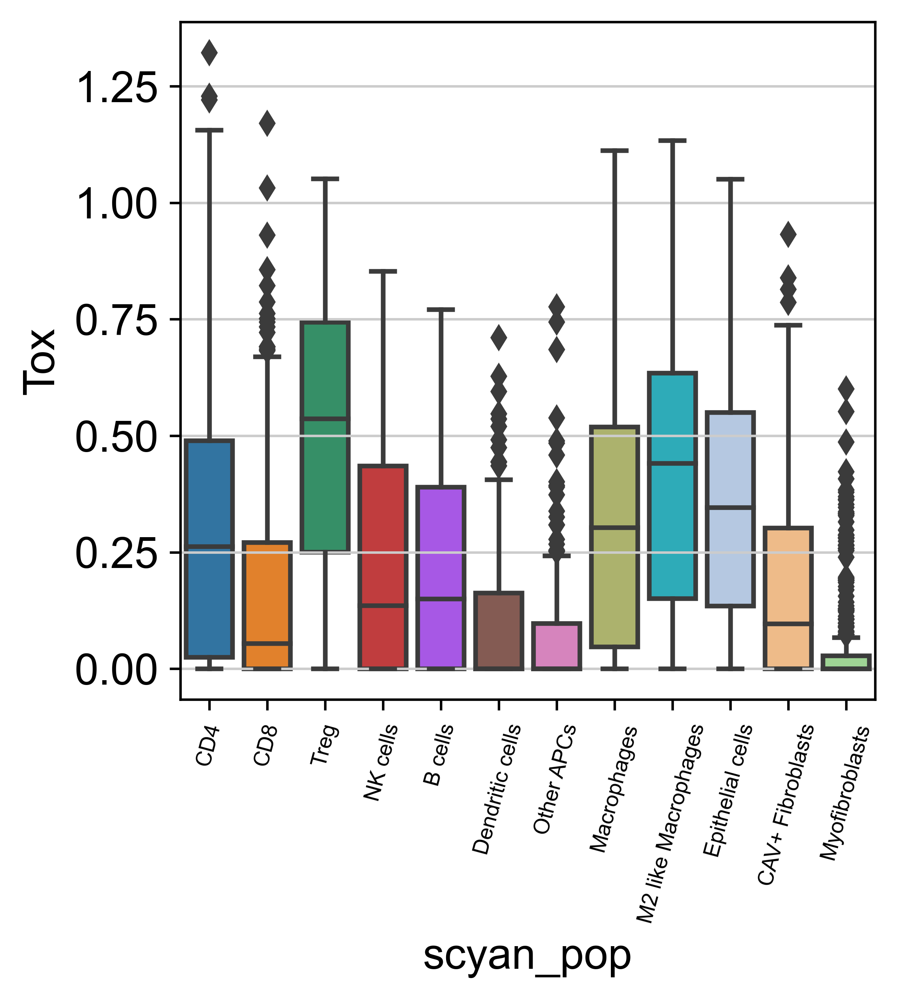

In [27]:
with rc_context({'xtick.labelsize' : 7}):
    ax = sns.boxplot(x='scyan_pop', y='Tox', data=df, order=sns_channels)
    ax.set_xticklabels(['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts'], rotation=75)

## Stacked violin plots

In [21]:
marker_genes_dict = ['CD4', 'CD8', 'CD3', 'FOXP3', 'CD56', 'CD20', 'CD11c', 'HLADQA1', 'HLADR', 'CD163', 'CD68', 'PanCK', 'CAV', 'SMA']

In [22]:
selected_clusters = ['CD4', 'CD8', 'Treg', 'B cells', 'NK cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

In [25]:
# Filter the data based on selected clusters
adata_filtered_all = adata[adata.obs['scyan_pop'].isin(selected_clusters)]

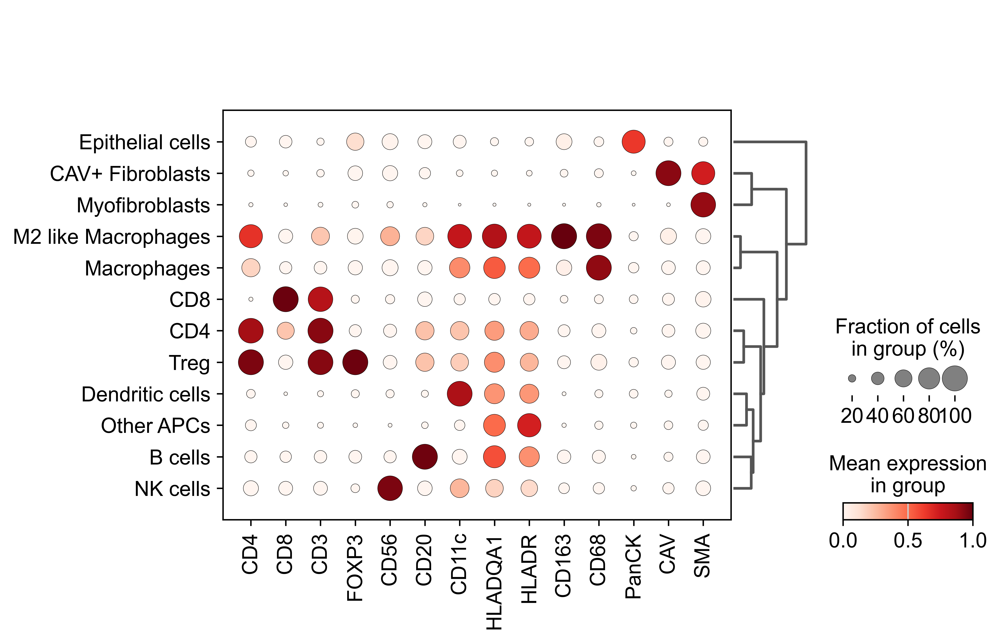

In [35]:
# Run the plot for all, remember to first run the z_score filtering
sc.pl.dotplot(adata_zscore, marker_genes_dict, groupby='scyan_pop', swap_axes=False, dendrogram=True, vmin = 0, vmax = 1)

In [34]:
marker_genes_dict_lympho = ['CD4', 'CD8', 'CD3', 'FOXP3', 'CD56', 'CD20']
marker_genes_dict_non_lympho = ['CD11c', 'HLADQA1', 'HLADR', 'CD163', 'CD68', 'PanCK', 'CAV', 'SMA']

In [35]:
clusters_non_lympho = ['Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

In [156]:
# List of clusters you want to select
selected_clusters = ['CD4', 'CD8', 'Treg', 'B cells', 'NK cells']

# Filter the data based on selected clusters
adata_filtered_lympho = adata[adata.obs['scyan_pop'].isin(selected_clusters)]

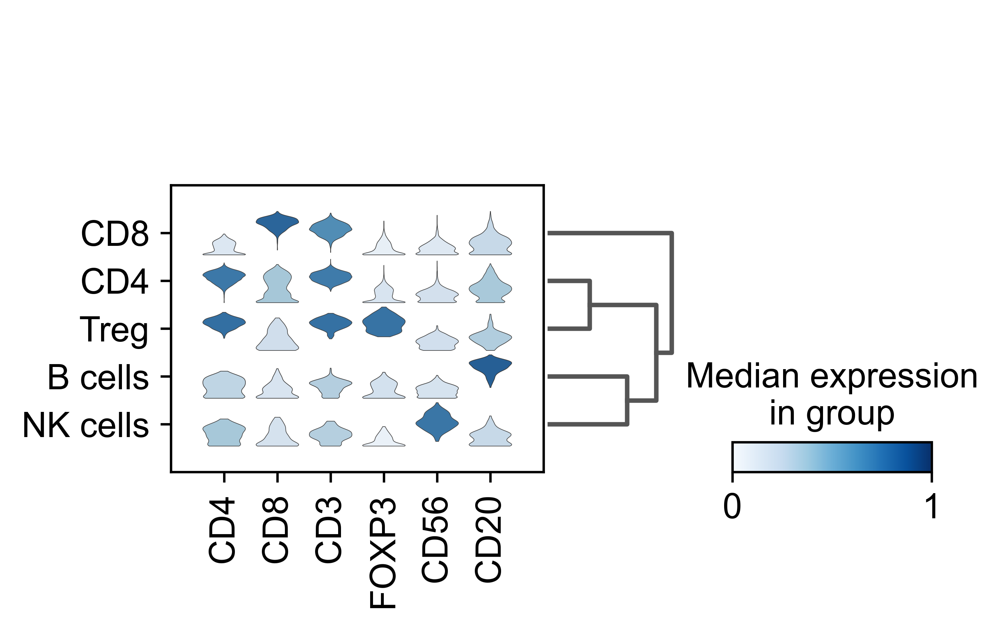

In [161]:
sc.pl.stacked_violin(adata_filtered_lympho, marker_genes_dict_lympho, groupby='scyan_pop', swap_axes=False, dendrogram=True, vmin = 0, vmax = 1)


## Getting the Z score for the entire anndata file for the dotplots

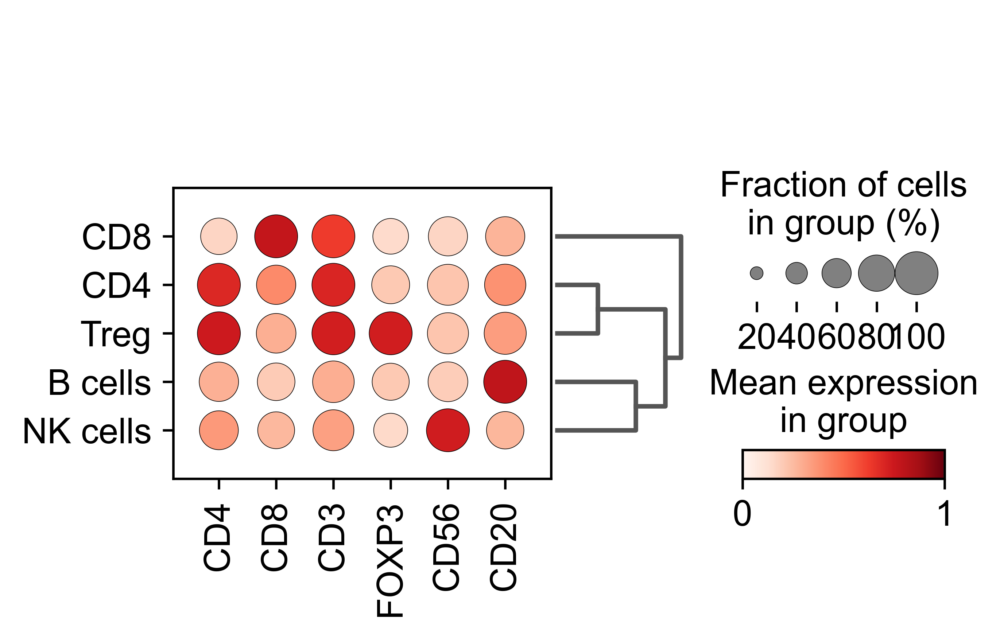

In [165]:
sc.pl.dotplot(adata_filtered_lympho, marker_genes_dict_lympho, groupby='scyan_pop', swap_axes=False, dendrogram=True, vmin = 0, vmax = 1)

## USE Z-SCORES HERE!! That will be better
## We can do this by preprocessing the anndata with sc.pp.scale

In [26]:
adata_zscore = sc.pp.scale(adata_filtered, max_value = 1, copy=bool)

In [80]:
# List of clusters you want to select
selected_clusters = ['CD4', 'CD8', 'Treg', 'B cells', 'NK cells']

# Filter the data based on selected clusters
adata_zscore_filtered_lympho = adata_zscore[adata_zscore.obs['scyan_pop'].isin(selected_clusters)]

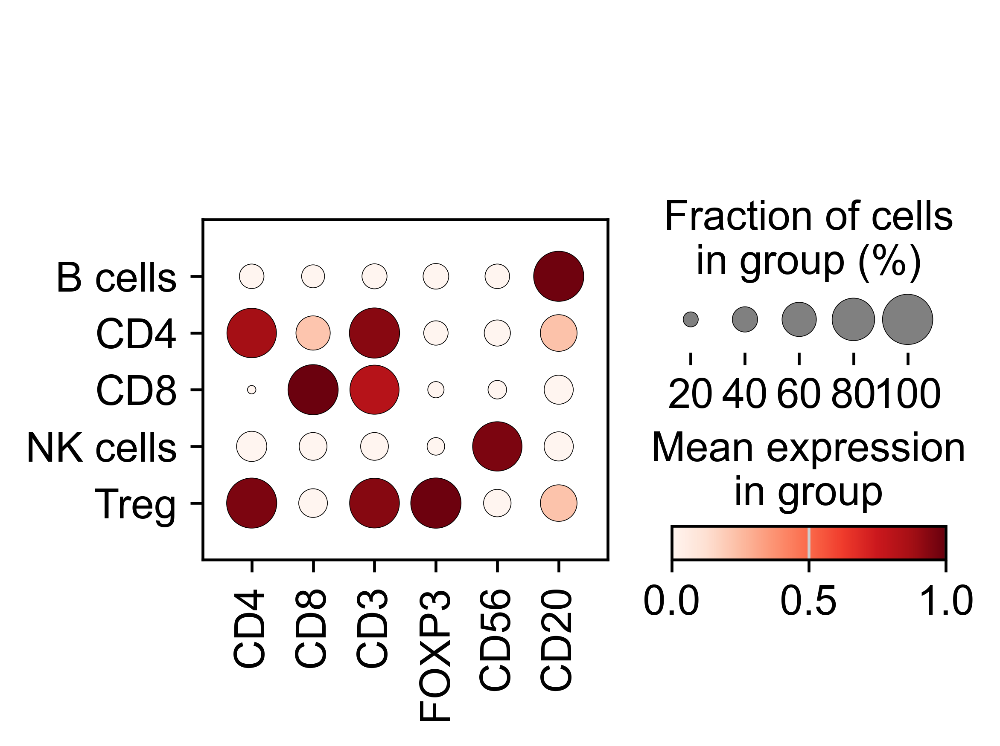

In [82]:
sc.pl.dotplot(adata_zscore_filtered_lympho, marker_genes_dict_lympho, groupby='scyan_pop', swap_axes=False, dendrogram=False, vmin = 0, vmax = 1)

In [83]:
# List of clusters you want to select
selected_clusters = ['Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

# Filter the data based on selected clusters
adata_filtered_non_lympho = adata_zscore[adata_zscore.obs['scyan_pop'].isin(selected_clusters)]

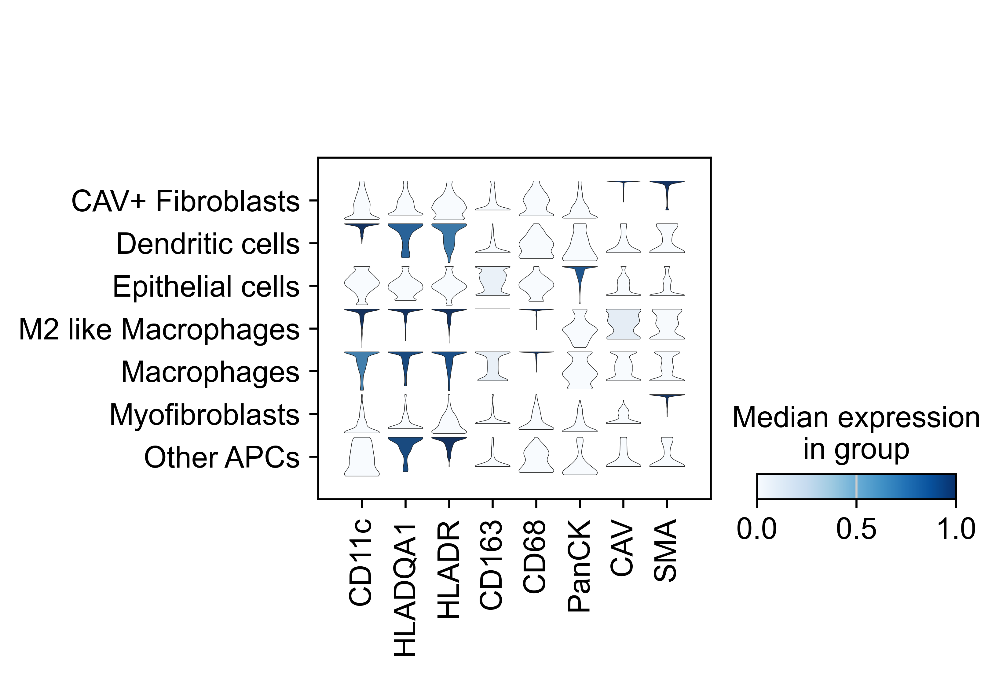

In [85]:
sc.pl.stacked_violin(adata_filtered_non_lympho, marker_genes_dict_non_lympho, groupby='scyan_pop', swap_axes=False, dendrogram=False, vmin = 0, vmax = 1)

In [86]:
# List of clusters you want to select
selected_clusters = ['Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

# Filter the data based on selected clusters
adata_zscore_filtered_non_lympho = adata_zscore[adata_zscore.obs['scyan_pop'].isin(selected_clusters)]

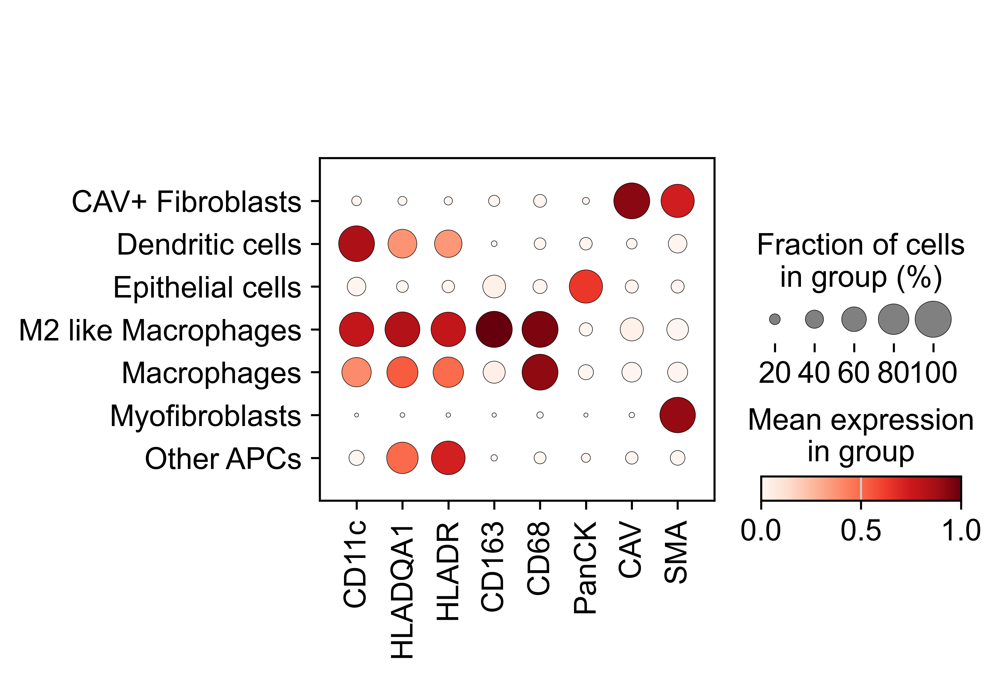

In [87]:
sc.pl.dotplot(adata_zscore_filtered_non_lympho, marker_genes_dict_non_lympho, groupby='scyan_pop', swap_axes=False, dendrogram=False, vmin = 0, vmax = 1)

## Ranking genes for IL10 and CXCL13

In [9]:
groups_to_include = ['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


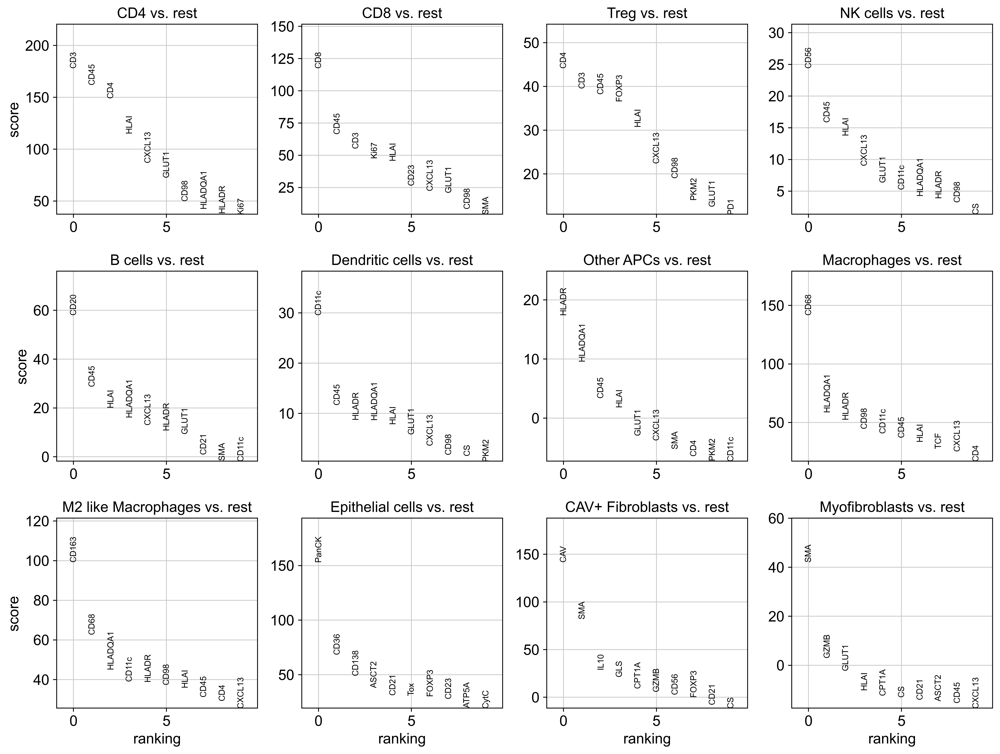

In [10]:
# Exclude the 'Unknown' group from the analysis, already done in this dataset
#groups_to_include = [group for group in adata.obs['scyan_pop'].cat.categories if group != 'Unknown']

# Perform rank_genes_groups analysis
sc.tl.rank_genes_groups(adata, 'scyan_pop', groups=groups_to_include, method='t-test')

# Plot the ranked genes
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

In [13]:
gene_of_interest = 'IL10'

# Get the indices that would sort the recarray by the specified field
sorted_indices = np.argsort(adata.uns['logfoldchanges'][gene_of_interest])

# Use the sorted indices to rearrange the recarray
sorted_results = results[sorted_indices]

KeyError: 'logfoldchanges'

## Heatmaps with scanpy
Look at the core plotting function tutorials
https://scanpy-tutorials.readthedocs.io/en/latest/plotting/core.html#Combining-plots-in-subplots

In [7]:
clusters_to_drop = 'Unknown'

adata_filtered = adata[adata.obs['scyan_pop'] != clusters_to_drop].copy()

In [8]:
groupby_order = ['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

In [9]:
marker_genes_dict = ['CD4', 'CD8', 'CD3', 'FOXP3', 'CD56', 'CD20', 'CD11c', 'HLADQA1', 'HLADR', 'CD163', 'CD68', 'PanCK', 'CAV', 'SMA']

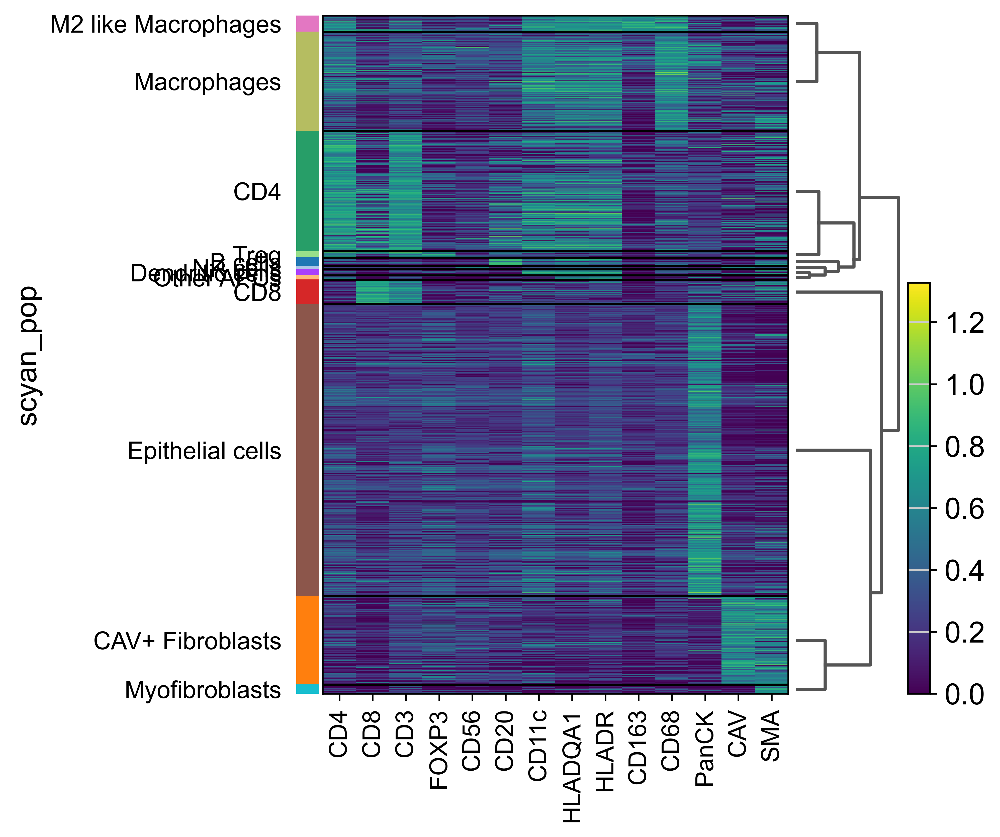

In [20]:
ax = sc.pl.heatmap(adata_filtered, marker_genes_dict, groupby='scyan_pop', cmap='viridis', dendrogram=True)

In [21]:
# List of clusters you want to select
selected_clusters = ['CD4', 'CD8', 'Treg', 'B cells', 'NK cells']

# Filter the data based on selected clusters
adata_filtered_lympho = adata[adata.obs['scyan_pop'].isin(selected_clusters)]

In [22]:
marker_genes_dict_lympho = ['CD4', 'CD8', 'CD3', 'FOXP3', 'CD56', 'CD20']

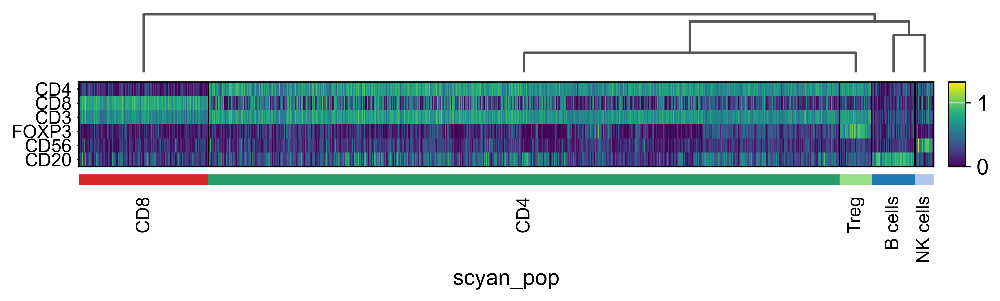

In [47]:
ax = sc.pl.heatmap(adata_filtered_lympho, marker_genes_dict_lympho, groupby='scyan_pop', cmap='viridis', dendrogram=True, swap_axes=True)

In [24]:
marker_genes_dict_non_lympho = ['CD11c', 'HLADQA1', 'HLADR', 'CD163', 'CD68', 'PanCK', 'CAV', 'SMA']

In [25]:
# List of clusters you want to select
selected_clusters = ['Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

# Filter the data based on selected clusters
adata_filtered_non_lympho = adata[adata.obs['scyan_pop'].isin(selected_clusters)]

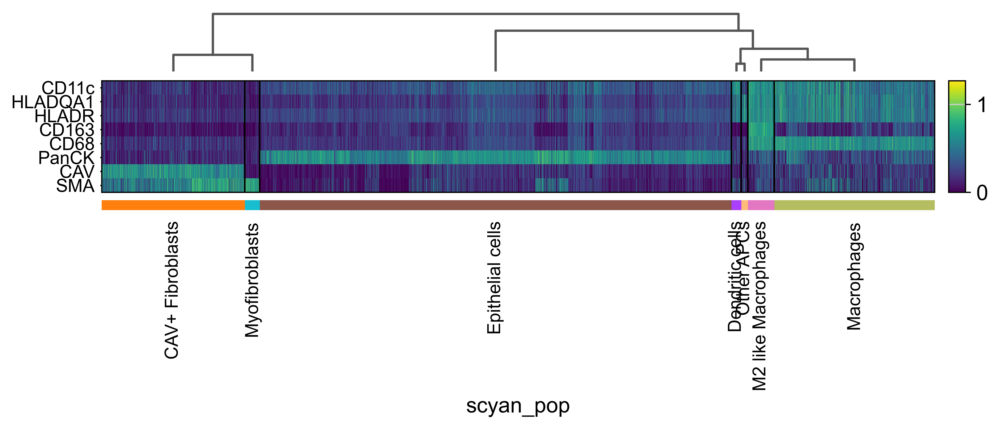

In [44]:
ax = sc.pl.heatmap(adata_filtered_non_lympho, marker_genes_dict_non_lympho, groupby='scyan_pop', cmap='viridis', dendrogram=True, swap_axes=True)

### Metabolism

In [48]:
marker_genes_metabolism = ['GLUT1', 'PKM2', 'CD98', 'ASCT2', 'GLS', 'CD36', 'CPT1A', 'CS', 'ATP5A', 'CytC']

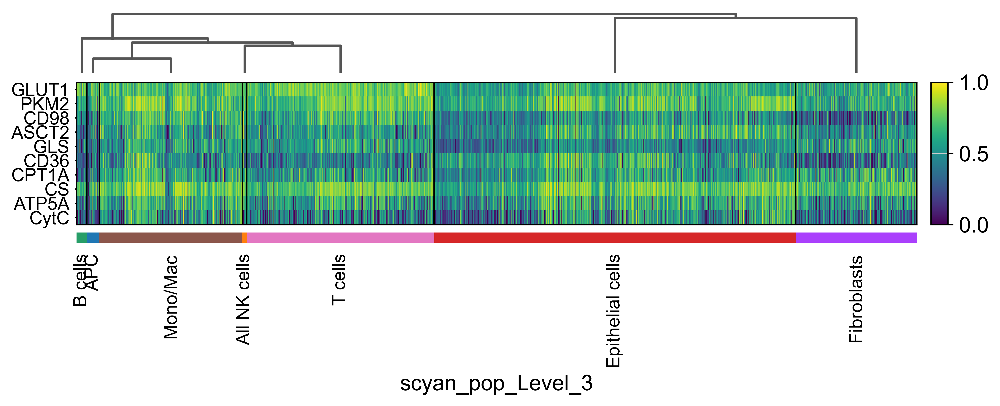

In [54]:
ax = sc.pl.heatmap(adata_filtered, marker_genes_metabolism, groupby='scyan_pop_Level_3', cmap='viridis', dendrogram=True, swap_axes=True, vmax=1)

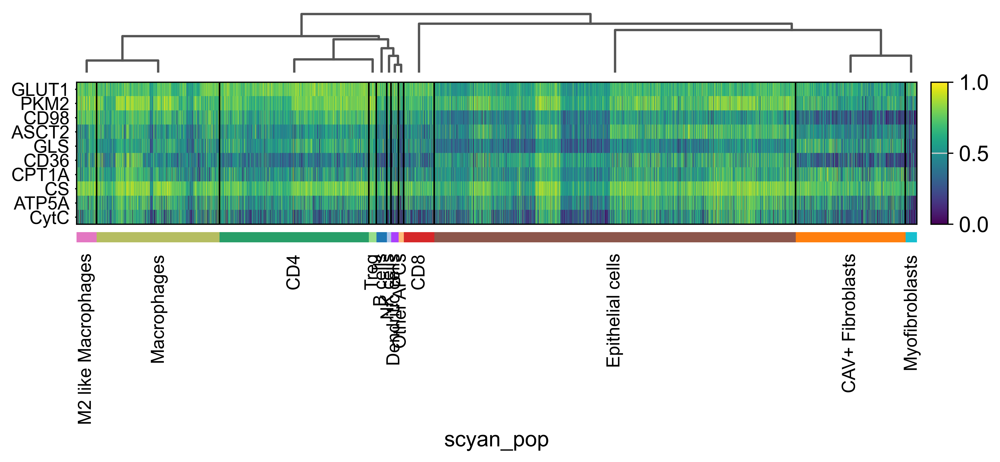

In [55]:
ax = sc.pl.heatmap(adata_filtered, marker_genes_metabolism, groupby='scyan_pop', cmap='viridis', dendrogram=True, swap_axes=True, vmax=1)

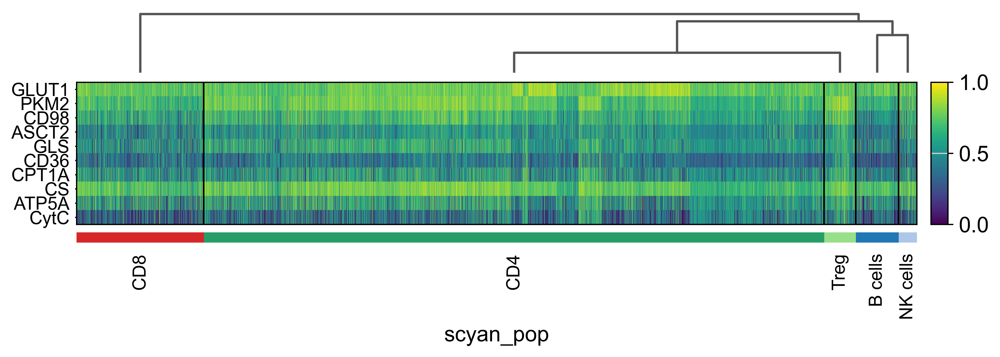

In [56]:
ax = sc.pl.heatmap(adata_filtered_lympho, marker_genes_metabolism, groupby='scyan_pop', cmap='viridis', dendrogram=True, swap_axes=True, vmax=1)

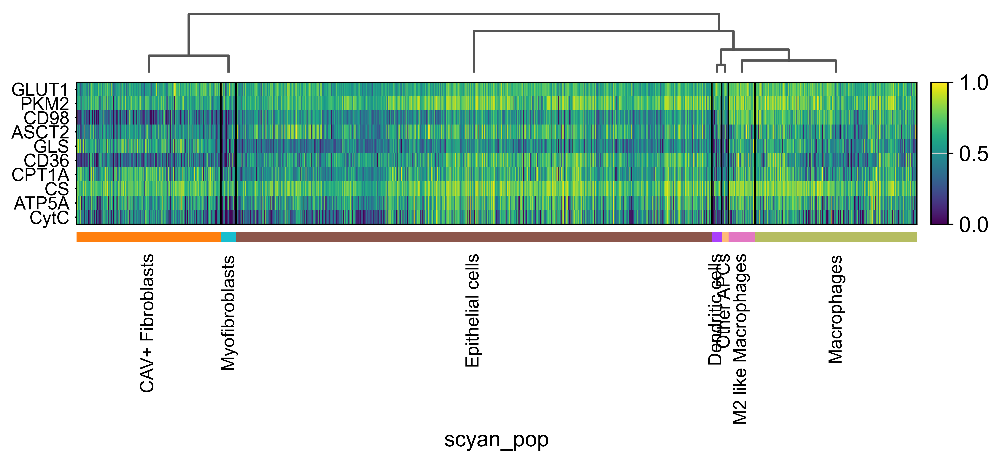

In [57]:
ax = sc.pl.heatmap(adata_filtered_non_lympho, marker_genes_metabolism, groupby='scyan_pop', cmap='viridis', dendrogram=True, swap_axes=True, vmax=1)

### Dotplots metabolism

In [ ]:
clusters_to_drop = 'Unknown'

adata_filtered = adata[adata.obs['scyan_pop'] != clusters_to_drop].copy()

In [ ]:
groupby_order = ['CD4', 'CD8', 'Treg', 'NK cells', 'B cells', 'Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

In [ ]:
marker_genes_metabolism = ['GLUT1', 'PKM2', 'CD98', 'ASCT2', 'GLS', 'CD36', 'CPT1A', 'CS', 'ATP5A', 'CytC']

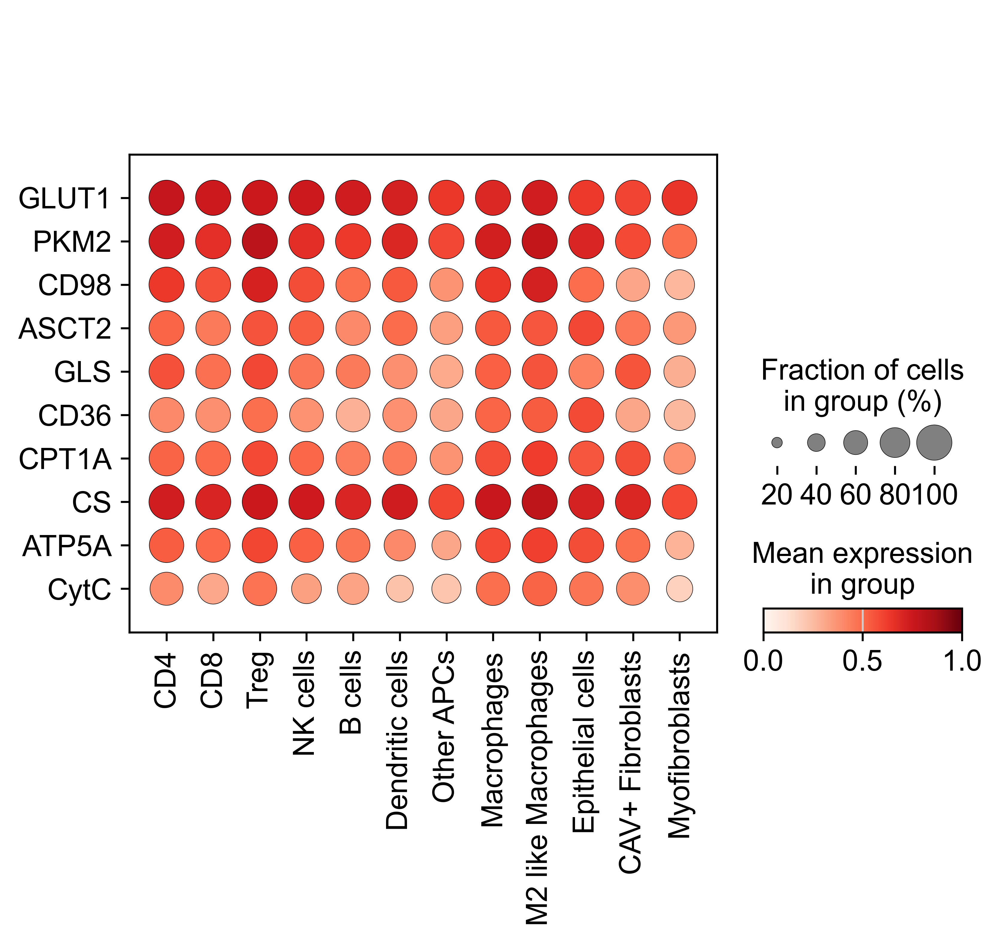

In [64]:
sc.pl.dotplot(adata_filtered, marker_genes_metabolism, groupby='scyan_pop', categories_order=groupby_order, swap_axes=True, vmin=0, vmax=1)

## Need to use Zscores

In [73]:
adata_zscore = sc.pp.scale(adata_filtered, max_value = 1, copy=bool)

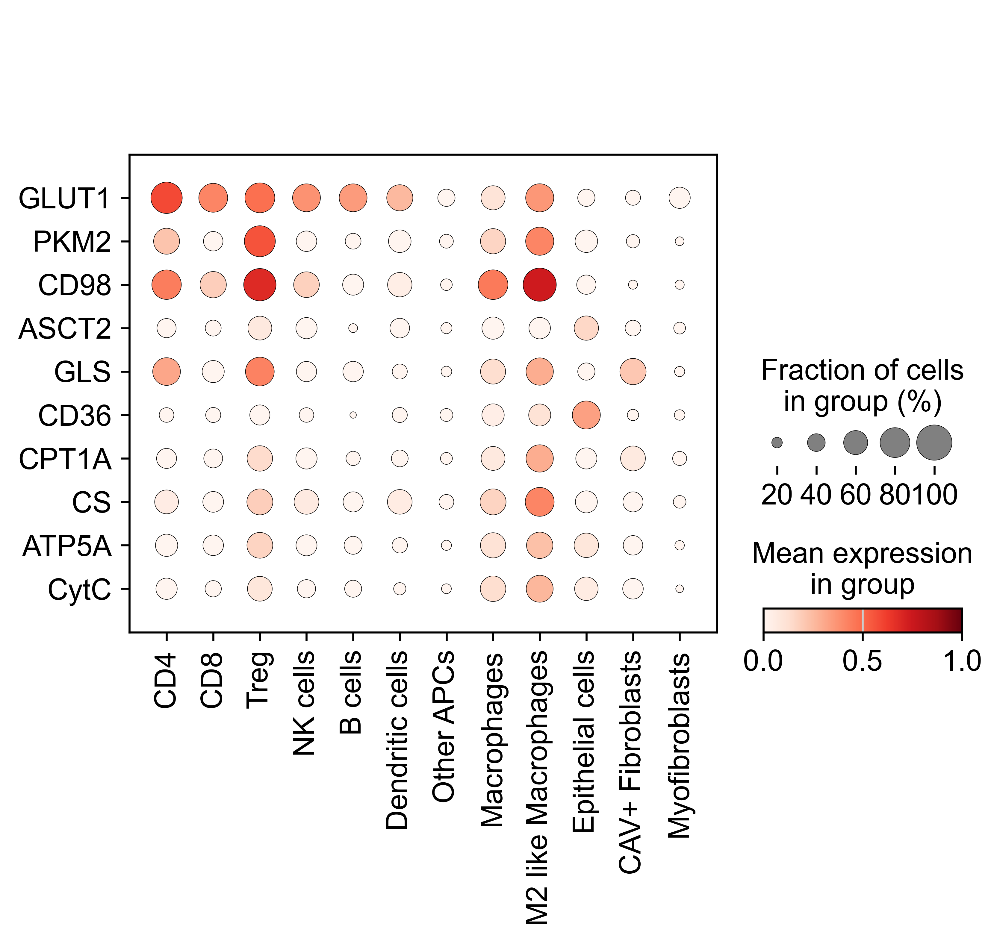

In [74]:
sc.pl.dotplot(adata_zscore, marker_genes_metabolism, groupby='scyan_pop', categories_order=groupby_order, swap_axes=True, vmin=0, vmax=1)

In [88]:
# List of clusters you want to select
selected_clusters = ['CD4', 'CD8', 'Treg', 'B cells', 'NK cells']

# Filter the data based on selected clusters
adata_zscore_filtered_lympho = adata_zscore[adata_zscore.obs['scyan_pop'].isin(selected_clusters)]

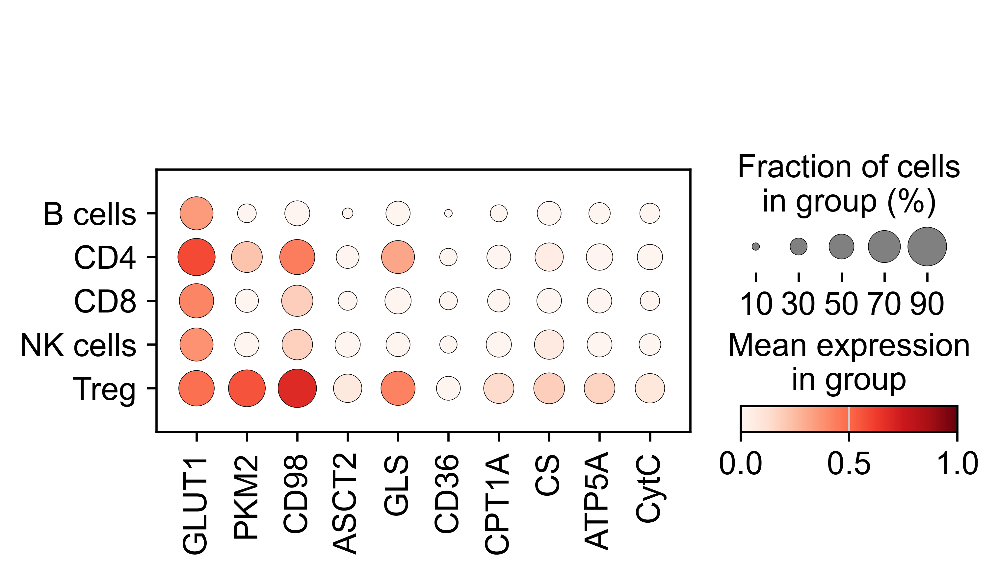

In [93]:
sc.pl.dotplot(adata_zscore_filtered_lympho, marker_genes_metabolism, groupby='scyan_pop', swap_axes=False, vmin=0, vmax=1)

In [94]:
# List of clusters you want to select
selected_clusters = ['Dendritic cells', 'Other APCs', 'Macrophages', 'M2 like Macrophages', 'Epithelial cells', 'CAV+ Fibroblasts', 'Myofibroblasts']

# Filter the data based on selected clusters
adata_filtered_non_lympho = adata[adata.obs['scyan_pop'].isin(selected_clusters)]

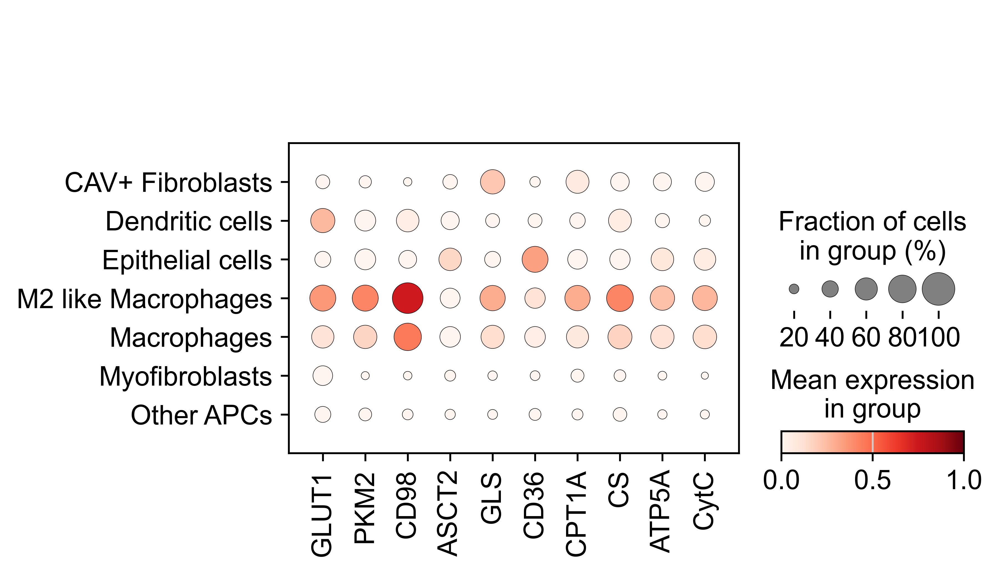

In [95]:
sc.pl.dotplot(adata_zscore_filtered_non_lympho, marker_genes_metabolism, groupby='scyan_pop', swap_axes=False, vmin=0, vmax=1)

## Check out spatial imaging with squidpy
https://squidpy.readthedocs.io/en/stable/

In [13]:
####read in anndata object, if you want to start from here
#set up the base directory
base_dir = 'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\ark-analysis-0.6.3\\data\\preprint\\2023-07-18-KK-BC25_21_1_KK003'
#set up the directory with the cell tables after running cellpose
cell_table_dir = os.path.join(base_dir, "segmentation\\cell_table")

In [14]:
adata = ad.read_h5ad(os.path.join(cell_table_dir,('cell_table_anndata_analysis_mesmerv2.h5ad')))

In [15]:
adata

AnnData object with n_obs × n_vars = 24999 × 37
    obs: 'label', 'fov', 'roi', 'X', 'Y', 'cell_size', 'scyan_pop', 'scyan_pop_Level_3', 'scyan_pop_Level_2', 'scyan_pop_Level_1', 'color', 'equivalent_diameter', 'area'
    uns: 'scyan_pop_colors'

In [16]:
adata.obs.head()

,label,fov,roi,X,Y,cell_size,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color,equivalent_diameter,area
0,1.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,2.733333,818.466667,120.0,Macrophages,Mono/Mac,Myeloid,Immune,lightgray,12.360774,120.0
1,2.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,2.261538,920.184615,65.0,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray,9.097284,65.0
2,3.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,3.295082,937.180328,61.0,CAV+ Fibroblasts,Fibroblasts,Stroma,Non-immune,lightgray,8.812923,61.0
3,4.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,3.879518,396.066265,166.0,CD4,T cells,Lymphoid,Immune,lightgray,14.538149,166.0
4,5.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,4.360360,454.324324,111.0,CD4,T cells,Lymphoid,Immune,lightgray,11.888212,111.0


In [20]:
sq.pl.spatial_segment(
    adata,
    seg_cell_id="label",
    color="GLUT1",
    img=False,
    cmap="inferno",
    scalebar_dx=2.0,
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"},
)

KeyError: 'Spatial basis `spatial` not found in `adata.obsm`.'

In [27]:
sq.pl.co_occurrence(
    adata, 
    cluster_key='scyan_pop'     
)

KeyError: "Unable to get the data from `adata.uns['scyan_pop_co_occurrence']`. Please run `squidpy.gr.co_occurrence(..., cluster_key='scyan_pop')` first."